In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import healpy as hp
from rubin_sim.data import get_baseline, get_data_dir
import rubin_sim.maf as maf

In [2]:
opsdb_file = get_baseline()
runName = os.path.split(opsdb_file)[-1].replace('.db', '')
print(runName)

baseline_v2.0_10yrs


In [3]:
# Demo the map 
# (not necessary for use with just the metrics - see below. This is just to demonstrate the slicepoint info)

cols = ['fieldRA', 'fieldDec', 'filter', 'observationStartMJD', 'visitExposureTime', 'fiveSigmaDepth', 'rotSkyPos']
simdata = maf.getSimData(opsdb_file, 'night <= 365*2', cols)
simdata[0:10]

rec.array([(310.0244801 , -60.81292802, 'y', 60218.00180556, 30., 22.3705568 , 62.75077469),
           (310.60187065, -63.56142457, 'y', 60218.00225414, 30., 22.33832685, 61.08425006),
           (311.2926113 , -66.31777378, 'y', 60218.00270279, 30., 22.29548686, 60.72618943),
           (312.1407313 , -69.08266621, 'y', 60218.00315152, 30., 21.27042123, 60.65678092),
           (304.17016259, -73.37544181, 'y', 60218.00362374, 30., 21.20527555, 49.09553663),
           (304.26955796, -70.56522163, 'y', 60218.00407267, 30., 21.26477096, 49.29742126),
           (310.0244801 , -60.81292802, 'y', 60218.00495938, 30., 21.40744224, 60.11341545),
           (310.60187065, -63.56142457, 'y', 60218.00540803, 30., 21.37457286, 59.34346652),
           (311.2926113 , -66.31777378, 'y', 60218.00585674, 30., 21.45500171, 59.0939424 ),
           (312.1407313 , -69.08266621, 'y', 60218.00630551, 30., 21.40615147, 59.1181414 )],
          dtype=[('fieldRA', '<f8'), ('fieldDec', '<f8'), ('filter', 

In [4]:
slicer = maf.HealpixSlicer(nside=64)
slicer.setupSlicer(simdata)
print(f'original slicepoint keys are {slicer.slicePoints.keys()}')

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
original slicepoint keys are dict_keys(['sid', 'ra', 'dec', 'nside', 'gall', 'galb'])


In [5]:
galmap = maf.GalacticPlanePriorityMap()
sp = galmap.run(slicer.slicePoints)

Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_u.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_g.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_r.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_i.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_z.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_y.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_sum.fits


In [6]:
# We have to make a slicePoint key for each galactic plane map component .. 
print(f'new slicepoint keys are {sp.keys()}')

new slicepoint keys are dict_keys(['sid', 'ra', 'dec', 'nside', 'gall', 'galb', 'galplane_priority_magellenic_clouds_map:u', 'galplane_priority_zucker_sfr_map:u', 'galplane_priority_galactic_bulge_map:u', 'galplane_priority_combined_map:u', 'galplane_priority_xrb_priority_map:u', 'galplane_priority_clementini_stellarpops_map:u', 'galplane_priority_galactic_plane_map:u', 'galplane_priority_open_clusters_map:u', 'galplane_priority_globular_clusters_map:u', 'galplane_priority_bonito_sfr_map:u', 'galplane_priority_pencilbeams_map:u', 'galplane_priority_magellenic_clouds_map:g', 'galplane_priority_zucker_sfr_map:g', 'galplane_priority_galactic_bulge_map:g', 'galplane_priority_combined_map:g', 'galplane_priority_xrb_priority_map:g', 'galplane_priority_clementini_stellarpops_map:g', 'galplane_priority_galactic_plane_map:g', 'galplane_priority_open_clusters_map:g', 'galplane_priority_globular_clusters_map:g', 'galplane_priority_bonito_sfr_map:g', 'galplane_priority_pencilbeams_map:g', 'galplan

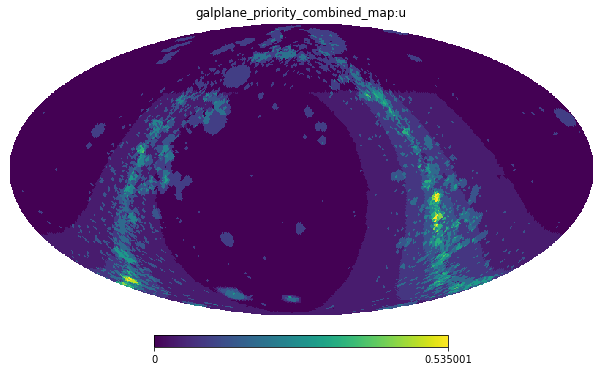

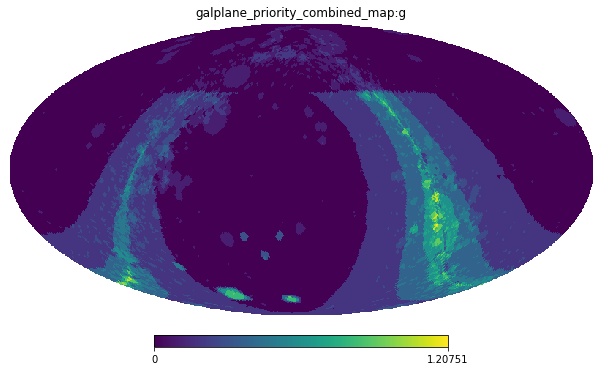

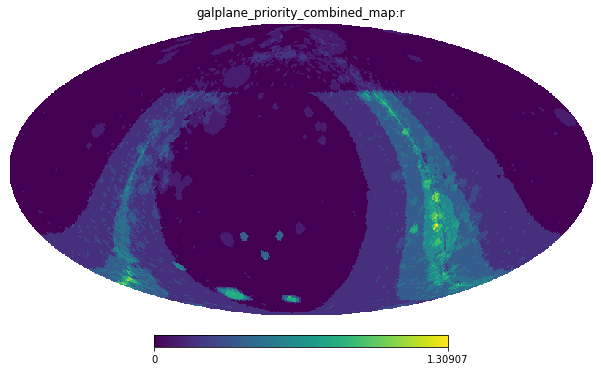

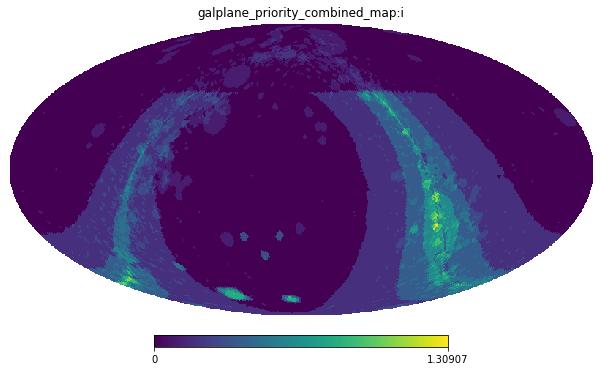

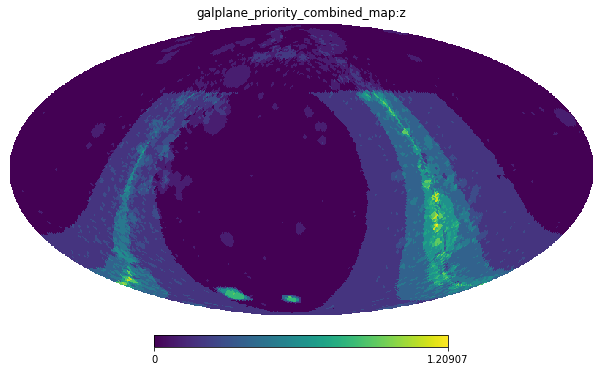

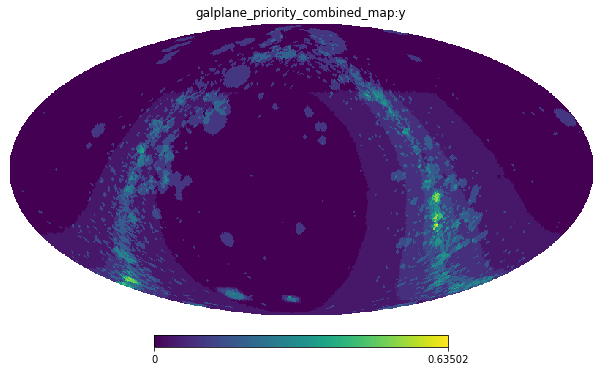

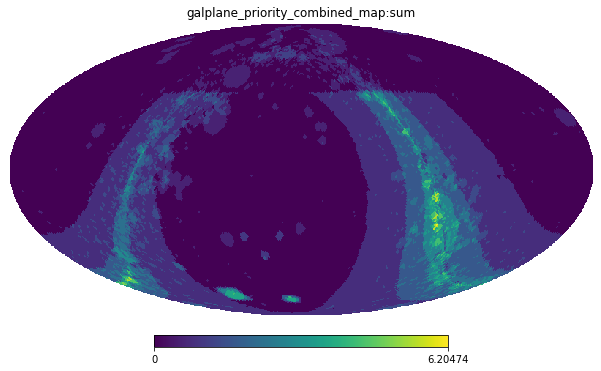

In [7]:
for key in [k for k in sp.keys() if 'galplane_priority' in k and 'combined' in k]:
    hp.mollview(sp[key], min=0, title=key)

In [8]:
# Okay and let's check a thing -- we've got these maps bundled up. 
# Does the slicepoint really access the correct point?
# Pick a point in the plane
idx = maf.radec2pix(ra=np.radians(250), dec=np.radians(-40), nside=64)
print(idx)
slicer[idx]['slicePoint']

40497


{'sid': 40497,
 'ra': 4.356505437595221,
 'dec': -0.7021142756051657,
 'nside': 64,
 'gall': 5.982230859344304,
 'galb': 0.0781489930402135,
 'galplane_priority_magellenic_clouds_map:u': 0.0,
 'galplane_priority_zucker_sfr_map:u': 0.0,
 'galplane_priority_galactic_bulge_map:u': 0.0,
 'galplane_priority_combined_map:u': 0.13500026,
 'galplane_priority_xrb_priority_map:u': 2.64386e-07,
 'galplane_priority_clementini_stellarpops_map:u': 0.0,
 'galplane_priority_galactic_plane_map:u': 0.135,
 'galplane_priority_open_clusters_map:u': 0.0,
 'galplane_priority_globular_clusters_map:u': 0.0,
 'galplane_priority_bonito_sfr_map:u': 0.0,
 'galplane_priority_pencilbeams_map:u': 0.0,
 'galplane_priority_magellenic_clouds_map:g': 0.0,
 'galplane_priority_zucker_sfr_map:g': 0.0,
 'galplane_priority_galactic_bulge_map:g': 0.0,
 'galplane_priority_combined_map:g': 0.6075053,
 'galplane_priority_xrb_priority_map:g': 5.3289587e-06,
 'galplane_priority_clementini_stellarpops_map:g': 0.0,
 'galplane_priori

In [9]:
# Okay, let's move along to the metrics themselves

footprint_summaries = [maf.SumMetric()]
footprint_plotdicts = {'percentileClip': 95}
filter_summaries = [maf.MeanMetric(), maf.MedianMetric(), maf.RmsMetric(),
                   maf.AreaThresholdMetric(lower_threshold=0.8)]
filter_plotdicts = {'colorMin': 0, 'colorMax': 2, 'xMin': 0, 'xMax': 5}
timescale_summaries = [maf.SumMetric(), maf.MedianMetric(), 
                       maf.AreaThresholdMetric(lower_threshold=0.5)]
timescale_plotdicts = {'colorMin': 0, 'colorMax': 1, 'xMin': 0, 'xMax': 1}

science_maps = [s.replace('galplane_priority_', '').split(":")[0] for s in galmap.keynames if 'sum' in s]

slicer = maf.HealpixSlicer(nside=64, useCache=False)
sql = None
bundles = {}
for m in science_maps:
    footprintmetric = maf.GalPlaneFootprintMetric(science_map = m)
    bundles[f'{m} footprint'] = maf.MetricBundle(footprintmetric, slicer, sql,
                                                 plotDict=footprint_plotdicts,
                                                 runName=runName, summaryMetrics=footprint_summaries)
    filtermetric = maf.GalPlaneTimePerFilterMetric(science_map = m)
    bundles[f'{m} filter'] = maf.MetricBundle(filtermetric, slicer, sql,
                                              plotDict=filter_plotdicts,
                                              runName=runName, summaryMetrics=filter_summaries)
    visit_timescalesmetric = maf.GalPlaneVisitIntervalsTimescaleMetric(science_map=m)
    bundles[f'{m} visit intervals'] = maf.MetricBundle(visit_timescalesmetric, slicer, sql,
                                                       plotDict=timescale_plotdicts,
                                                       runName=runName, summaryMetrics=timescale_summaries)
    season_timescalemetric = maf.GalPlaneSeasonGapsTimescaleMetric(science_map=m)
    bundles[f'{m} season gaps'] = maf.MetricBundle(season_timescalemetric, slicer, sql,
                                                   plotDict=timescale_plotdicts,
                                                   runName=runName, summaryMetrics=timescale_summaries)

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


In [10]:
!/bin/rm galplane_test/*
outDir = 'galplane_test'
resultsDb = maf.ResultsDb(outDir)
g = maf.MetricBundleGroup(bundles, opsdb_file, outDir='galplane_test', resultsDb=resultsDb)
g.runAll()

Querying table None with no constraint for columns ['rotSkyPos', 'fiveSigmaDepth', 'filter', 'observationStartMJD', 'fieldRA', 'visitExposureTime', 'fieldDec'].
Found 2086980 visits
Running:  ['magellenic_clouds_map footprint', 'magellenic_clouds_map filter', 'magellenic_clouds_map visit intervals', 'magellenic_clouds_map season gaps', 'zucker_sfr_map footprint', 'zucker_sfr_map filter', 'zucker_sfr_map visit intervals', 'zucker_sfr_map season gaps', 'galactic_bulge_map footprint', 'galactic_bulge_map filter', 'galactic_bulge_map visit intervals', 'galactic_bulge_map season gaps', 'combined_map footprint', 'combined_map filter', 'combined_map visit intervals', 'combined_map season gaps', 'xrb_priority_map footprint', 'xrb_priority_map filter', 'xrb_priority_map visit intervals', 'xrb_priority_map season gaps', 'clementini_stellarpops_map footprint', 'clementini_stellarpops_map filter', 'clementini_stellarpops_map visit intervals', 'clementini_stellarpops_map season gaps', 'galactic_pla

In [11]:
# Note that the 'reduce' function output is available in the bundles dictionary .. we have lots of keys now!
len(list(bundles.keys()))

330

In [12]:
# Plot to the output directory
g.plotAll()

/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/plotHandler.py:583: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn(
0.0 180.0 -180.0 180.0


Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram range was single-valued; expanding default range.
  warnings.warn("Histogram range was single-valued; expanding default range.")
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: invalid value encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:129: UserWarning: Optimal bin calculation calculated NaN: returning 200
  warnings.warn(
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:567: UserWarning: Attempting to set identical left == right == 0.949999988079071 results in singular transformations; automatically expanding.
  plt.xlim(right=plotDict["xMax"])
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: Us

0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: divide by zero encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make inf bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make 206 bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make 212 bins, returning 200
  warnings.warn(
0.0 1

0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram range was single-valued; expanding default range.
  warnings.warn("Histogram range was single-valued; expanding default range.")
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: divide by zero encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make inf bins, returning 200
  warnings.warn(
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:567: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  plt.xlim(right=plotDict["xMax"])
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialP

/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make 672 bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make 244 bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make 442 bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make 678 bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make 726 bins, returning 200
  warnings.warn(
0.

0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:93: UserWarning: No unmasked data available for calculating optimal bin size: returning 200 bins
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: invalid value encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:129: UserWarning: Optimal bin calculation calculated NaN: returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:11

0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make 130231 bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make 280 bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: divide by zero encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make inf bins, returning 

0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram range was single-valued; expanding default range.
  warnings.warn("Histogram range was single-valued; expanding default range.")
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: invalid value encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:129: UserWarning: Optimal bin calculation calculated NaN: returning 200
  warnings.warn(
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:567: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  plt.xlim(right=plotDict["xMax"])
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram range was single

Plotting complete.


/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/plotHandler.py:583: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:186: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(

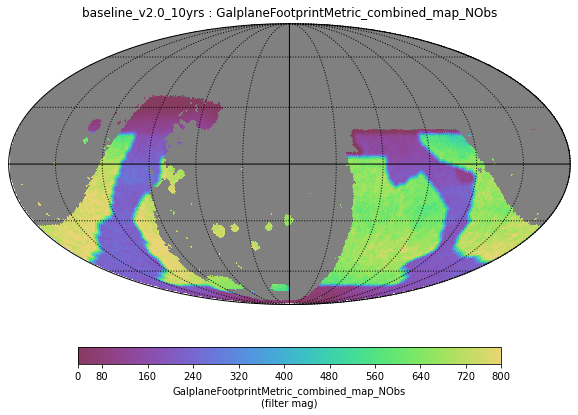

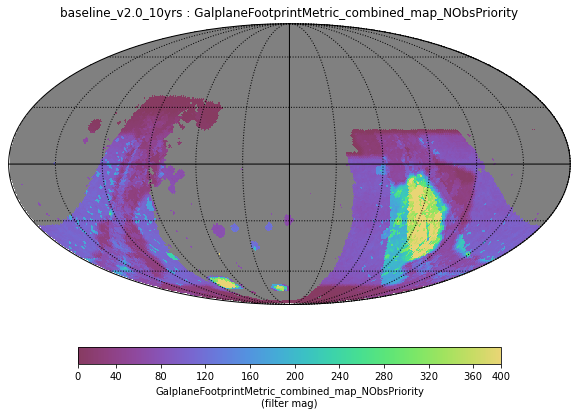

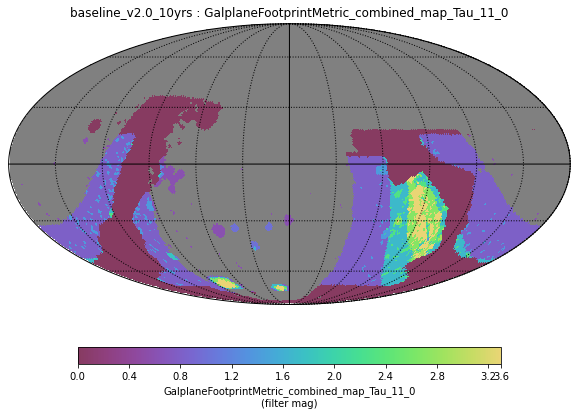

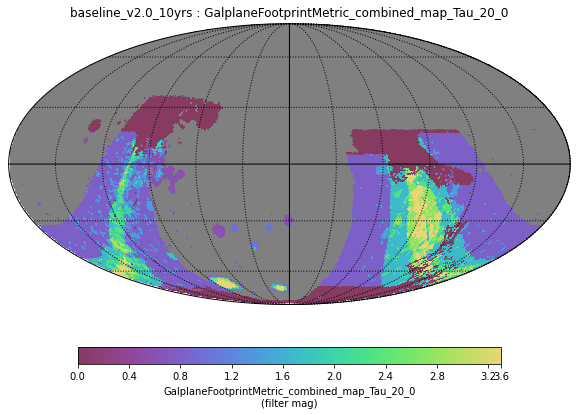

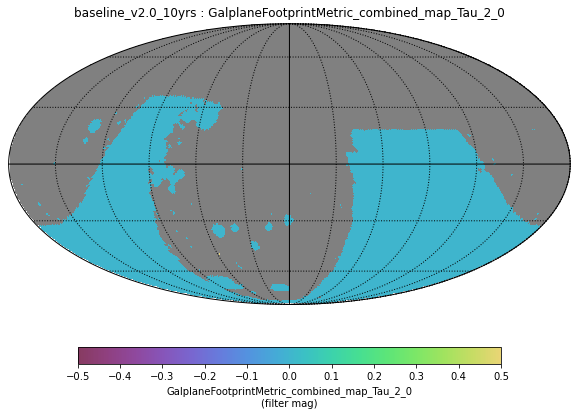

...

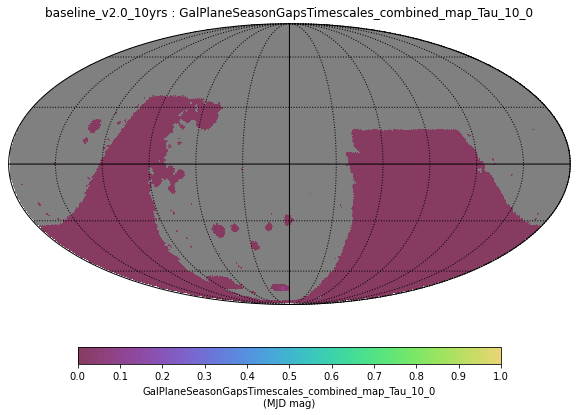

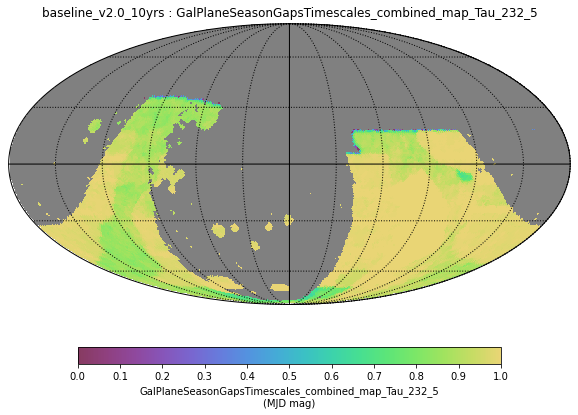

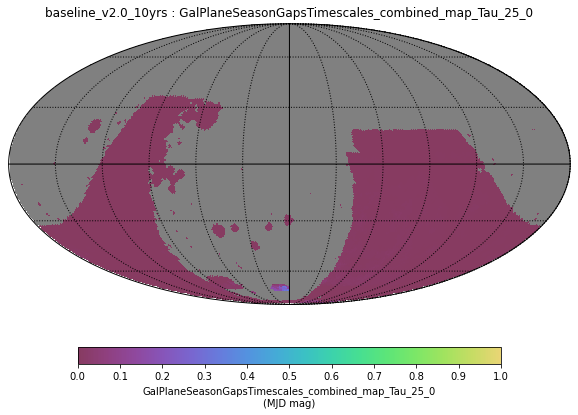

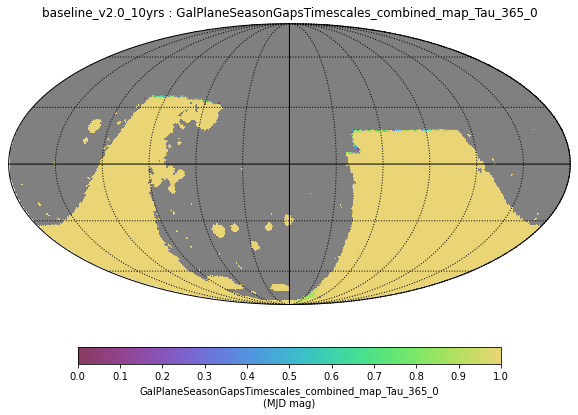

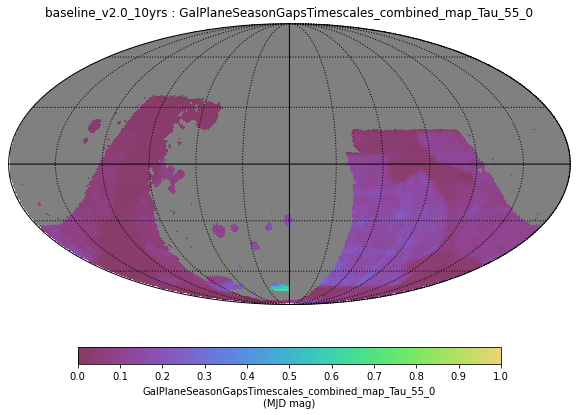

In [13]:
plots = [p for p in bundles.keys() if 'combined_map' in p]
for p in plots:
    plotDict = {'figsize': (8, 6)}
    bundles[p].setPlotDict(plotDict)
    bundles[p].plot(plotFunc=maf.HealpixSkyMap())

In [14]:
rc = maf.RunComparison(runDirs=[outDir])
mdict = rc.buildMetricDict()
rc.addSummaryStats(mdict)

In [15]:
pd.set_option("display.max_rows", None)
rc.summaryStats.T

run_name,baseline_v2.0_10yrs
metric,
Sum GalplaneFootprintMetric_magellenic_clouds_map_NObs HealpixSlicer,3.466000e+04
Sum GalplaneFootprintMetric_magellenic_clouds_map_NObsPriority HealpixSlicer,5.660650e+03
Sum GalplaneFootprintMetric_magellenic_clouds_map_Tau_11_0 HealpixSlicer,5.130000e+01
Sum GalplaneFootprintMetric_magellenic_clouds_map_Tau_20_0 HealpixSlicer,5.130000e+01
Sum GalplaneFootprintMetric_magellenic_clouds_map_Tau_2_0 HealpixSlicer,0.000000e+00
Sum GalplaneFootprintMetric_magellenic_clouds_map_Tau_46_5 HealpixSlicer,5.130000e+01
Sum GalplaneFootprintMetric_magellenic_clouds_map_Tau_5_0 HealpixSlicer,0.000000e+00
Sum GalplaneFootprintMetric_magellenic_clouds_map_Tau_73_0 HealpixSlicer,5.130000e+01
AreaThreshold GalplaneTimePerFilter_magellenic_clouds_map_g HealpixSlicer,0.000000e+00


In [37]:
# Read in the summary stats from some other directories of interest (with the same contents)
dirs = [d for d in os.listdir('.') if 'galplane' in d]

rc = maf.RunComparison(runDirs=dirs)
rc.addSummaryStats()
rc.summaryStats.T[0:10]

run_name,vary_gp_gpfrac0.35_v2.0_10yrs,vary_gp_gpfrac0.30_v2.0_10yrs,baseline_v2.0_10yrs,vary_gp_gpfrac0.55_v2.0_10yrs,vary_gp_gpfrac0.05_v2.0_10yrs,vary_gp_gpfrac0.50_v2.0_10yrs,vary_gp_gpfrac0.75_v2.0_10yrs,vary_gp_gpfrac0.20_v2.0_10yrs,vary_gp_gpfrac1.00_v2.0_10yrs,vary_gp_gpfrac0.25_v2.0_10yrs,vary_gp_gpfrac0.40_v2.0_10yrs,vary_gp_gpfrac0.15_v2.0_10yrs,vary_gp_gpfrac0.01_v2.0_10yrs,vary_gp_gpfrac0.45_v2.0_10yrs,vary_gp_gpfrac0.10_v2.0_10yrs
metric,,,,,,,,,,,,,,,
Sum GalplaneFootprintMetric_xrb_priority_map_NObs HealpixSlicer,1.837796e+07,1.837104e+07,1.837867e+07,1.839268e+07,1.835141e+07,1.839463e+07,1.835052e+07,1.837526e+07,1.834995e+07,1.833424e+07,1.838599e+07,1.834525e+07,1.833242e+07,1.837144e+07,1.834127e+07
Sum GalplaneFootprintMetric_xrb_priority_map_NObsPriority HealpixSlicer,1.048234e+02,1.076770e+02,1.078312e+02,1.087180e+02,1.095895e+02,1.062822e+02,1.075012e+02,1.090308e+02,1.057017e+02,1.094368e+02,1.080806e+02,1.110888e+02,1.061204e+02,1.087522e+02,1.092198e+02
Sum GalplaneFootprintMetric_xrb_priority_map_Tau_11_0 HealpixSlicer,7.914102e-01,7.909914e-01,7.901432e-01,8.439166e-01,7.901847e-01,8.148872e-01,9.209293e-01,7.900495e-01,9.308221e-01,7.911274e-01,7.933295e-01,7.903659e-01,7.891305e-01,7.960181e-01,7.897988e-01
Sum GalplaneFootprintMetric_xrb_priority_map_Tau_20_0 HealpixSlicer,9.198188e-01,9.036151e-01,8.789282e-01,9.335297e-01,8.191334e-01,9.330186e-01,9.343831e-01,8.271869e-01,9.351153e-01,8.679912e-01,9.253722e-01,8.219127e-01,8.182037e-01,9.317299e-01,8.194211e-01
Sum GalplaneFootprintMetric_xrb_priority_map_Tau_2_0 HealpixSlicer,6.257374e-05,6.214485e-05,6.214485e-05,6.257374e-05,6.257374e-05,6.257374e-05,6.257374e-05,6.257374e-05,6.208174e-05,6.257374e-05,6.214485e-05,6.208174e-05,6.257374e-05,6.257374e-05,6.257374e-05
Sum GalplaneFootprintMetric_xrb_priority_map_Tau_46_5 HealpixSlicer,9.387561e-01,9.389325e-01,9.384219e-01,9.393131e-01,9.168314e-01,9.393107e-01,9.396029e-01,9.358887e-01,9.391843e-01,9.381458e-01,9.389446e-01,9.352849e-01,9.160755e-01,9.393407e-01,9.212011e-01
Sum GalplaneFootprintMetric_xrb_priority_map_Tau_5_0 HealpixSlicer,8.192567e-04,8.562519e-04,9.312403e-04,1.179481e-04,2.929671e-03,1.108541e-04,7.354414e-05,1.701642e-03,7.392538e-05,9.598170e-04,4.265533e-04,2.008736e-03,3.035320e-03,1.426169e-04,2.540390e-03
Sum GalplaneFootprintMetric_xrb_priority_map_Tau_73_0 HealpixSlicer,9.414674e-01,9.415574e-01,9.411491e-01,9.420346e-01,9.289042e-01,9.420402e-01,9.417656e-01,9.404401e-01,9.418318e-01,9.411099e-01,9.415740e-01,9.403264e-01,9.208637e-01,9.419548e-01,9.398768e-01
Mean GalplaneTimePerFilter_xrb_priority_map_g HealpixSlicer,3.882804e+00,4.081767e+00,4.024127e+00,4.062704e+00,3.852042e+00,4.122670e+00,4.074087e+00,3.864927e+00,3.941644e+00,4.086392e+00,3.986599e+00,3.863469e+00,3.805383e+00,3.893164e+00,3.844055e+00


In [17]:
rc.summaryStats.to_csv('galactic_plane_summary_stats.csv')

In [18]:
# Use some of the tools in the maf.RunComparison module to help compare outputs from these multiple runs
family_runs = maf.archive.get_family_runs()
# family_runs.loc['vary_gp']
these_runs = list(family_runs.loc['vary_gp'].run.values)
these_runs += ['baseline_v2.0_10yrs']
these_runs

['vary_gp_gpfrac0.01_v2.0_10yrs',
 'vary_gp_gpfrac0.05_v2.0_10yrs',
 'vary_gp_gpfrac0.10_v2.0_10yrs',
 'vary_gp_gpfrac0.15_v2.0_10yrs',
 'vary_gp_gpfrac0.20_v2.0_10yrs',
 'vary_gp_gpfrac0.25_v2.0_10yrs',
 'vary_gp_gpfrac0.30_v2.0_10yrs',
 'vary_gp_gpfrac0.35_v2.0_10yrs',
 'vary_gp_gpfrac0.40_v2.0_10yrs',
 'vary_gp_gpfrac0.45_v2.0_10yrs',
 'vary_gp_gpfrac0.50_v2.0_10yrs',
 'vary_gp_gpfrac0.55_v2.0_10yrs',
 'vary_gp_gpfrac0.75_v2.0_10yrs',
 'vary_gp_gpfrac1.00_v2.0_10yrs',
 'baseline_v2.0_10yrs']

In [19]:
summaries = maf.archive.get_metric_summaries(summary_source='galactic_plane_summary_stats.csv')
# Sort the summaries in the order above -- 
# this should make trends with 'time spent on galactic plane' easier to see
summaries = summaries.loc[these_runs]
summaries

metric,Sum GalplaneFootprintMetric_xrb_priority_map_NObs HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_NObsPriority HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_11_0 HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_20_0 HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_2_0 HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_46_5 HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_5_0 HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_73_0 HealpixSlicer,Mean GalplaneTimePerFilter_xrb_priority_map_g HealpixSlicer,Median GalplaneTimePerFilter_xrb_priority_map_g HealpixSlicer,...,AreaThreshold GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_232_5 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_25_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_25_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_25_0 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_365_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_365_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_365_0 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_55_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_55_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_55_0 HealpixSlicer
run,,,,,,,,,,,,,,,,,,,,,
vary_gp_gpfrac0.01_v2.0_10yrs,18332415.0,106.120384,0.789131,0.818204,0.000063,0.916076,0.003035,0.920864,3.805383,0.463569,...,12514.707544,54.362597,0.001358,0.0,15196.680505,1.0,12863.853700,1286.423806,0.070794,9.232230
vary_gp_gpfrac0.05_v2.0_10yrs,18351414.0,109.589537,0.790185,0.819133,0.000063,0.916831,0.002930,0.928904,3.852042,0.465755,...,12737.120360,55.889880,0.001436,0.0,15258.918046,1.0,12924.282843,1287.386247,0.072205,11.750111
vary_gp_gpfrac0.10_v2.0_10yrs,18341271.0,109.219752,0.789799,0.819421,0.000063,0.921201,0.002540,0.939877,3.844055,0.471278,...,12861.335819,60.931732,0.001393,0.0,15360.820032,1.0,12939.390128,1308.620042,0.073869,12.589405
vary_gp_gpfrac0.15_v2.0_10yrs,18345253.0,111.088759,0.790366,0.821913,0.000062,0.935285,0.002009,0.940326,3.863469,0.470244,...,12894.068271,55.988131,0.001609,0.0,15394.644947,1.0,12944.425890,1316.864573,0.075335,15.946579
vary_gp_gpfrac0.20_v2.0_10yrs,18375257.0,109.030829,0.790050,0.827187,0.000063,0.935889,0.001702,0.940440,3.864927,0.470905,...,12902.461208,58.328372,0.001478,0.0,15405.915528,1.0,12946.943771,1333.799124,0.072123,26.857397
vary_gp_gpfrac0.25_v2.0_10yrs,18334237.0,109.436783,0.791127,0.867991,0.000063,0.938146,0.000960,0.941110,4.086392,0.470648,...,12918.407787,55.174710,0.001310,0.0,15420.340413,1.0,12957.854588,1330.275376,0.070148,26.857397
vary_gp_gpfrac0.30_v2.0_10yrs,18371035.0,107.676966,0.790991,0.903615,0.000062,0.938932,0.000856,0.941557,4.081767,0.473310,...,12921.764962,52.480580,0.001528,0.0,15421.979580,1.0,12955.336707,1363.678325,0.075476,7.553643
vary_gp_gpfrac0.35_v2.0_10yrs,18377961.0,104.823355,0.791410,0.919819,0.000063,0.938756,0.000819,0.941467,3.882804,0.470570,...,12919.247081,52.876759,0.001843,0.0,15424.523432,1.0,12957.015295,1410.762693,0.081308,0.839294
vary_gp_gpfrac0.40_v2.0_10yrs,18385990.0,108.080561,0.793330,0.925372,0.000062,0.938945,0.000427,0.941574,3.986599,0.473407,...,12927.640017,64.241005,0.001975,0.0,15431.223262,1.0,12967.926112,1496.468484,0.087435,36.089627


In [42]:
# Identify some subsets of these metrics to make better visualizations
tau_obs = np.array([2.0, 5.0, 11.0, 46.5, 73])
tau_seasons = tau_obs * 5
tau_names = [f'Tau_{tau:.1f}'.replace('.', '_') for tau in tau_obs]
tau_season_names = [f'Tau_{tau:.1f}'.replace('.', '_') for tau in tau_seasons]
filterlist = ('u', 'g', 'r', 'i', 'z', 'y')
metricnames = {}
for tau, tau_name in zip(tau_obs, tau_names):
    metricnames[f'footprint {tau}'] = [m for m in summaries.columns if 'Footprint' in m and tau_name in m]
    metricnames[f'sum visit intervals {tau}'] = [m for m in summaries.columns 
                                                 if 'VisitIntervals' in m and tau_name in m and 'Sum' in m]
    metricnames[f'area visit intervals {tau}'] = [m for m in summaries.columns 
                                                 if 'VisitIntervals' in m and tau_name in m and 'Area' in m]
    metricnames[f'median visit intervals {tau}'] = [m for m in summaries.columns 
                                                 if 'VisitIntervals' in m and tau_name in m and 'Median' in m]
for tau, tau_name in zip(tau_seasons, tau_season_names):
    metricnames[f'sum season gaps {tau}'] = [m for m in summaries.columns 
                                                 if 'SeasonGaps' in m and tau_name in m and 'Sum' in m]
    metricnames[f'area season gaps {tau}'] = [m for m in summaries.columns 
                                                 if 'SeasonGaps' in m and tau_name in m and 'Area' in m]
    metricnames[f'median season gaps {tau}'] = [m for m in summaries.columns 
                                                 if 'SeasonGaps' in m and tau_name in m and 'Median' in m]
for f in filterlist:
    metricnames[f'area filter {f}'] = [m for m in summaries.columns 
                                       if 'Filter' in m and f"_{f}  HealpixSlicer"  in m and "Area" in m]
    metricnames[f'mean filter {f}'] = [m for m in summaries.columns 
                                       if 'Filter' in m and f"_{f}  HealpixSlicer" in m and 'Mean' in m]
    metricnames[f'rms filter {f}'] = [m for m in summaries.columns 
                                      if 'Filter' in m and f"_{f}  HealpixSlicer"  in m and 'Rms' in m]
for k in metricnames:
    print(k, len(metricnames[k]))

footprint 2.0 11
sum visit intervals 2.0 11
area visit intervals 2.0 11
median visit intervals 2.0 11
footprint 5.0 11
sum visit intervals 5.0 11
area visit intervals 5.0 11
median visit intervals 5.0 11
footprint 11.0 11
sum visit intervals 11.0 11
area visit intervals 11.0 11
median visit intervals 11.0 11
footprint 46.5 11
sum visit intervals 46.5 11
area visit intervals 46.5 11
median visit intervals 46.5 11
footprint 73.0 11
sum visit intervals 73.0 11
area visit intervals 73.0 11
median visit intervals 73.0 11
sum season gaps 10.0 11
area season gaps 10.0 11
median season gaps 10.0 11
sum season gaps 25.0 11
area season gaps 25.0 11
median season gaps 25.0 11
sum season gaps 55.0 11
area season gaps 55.0 11
median season gaps 55.0 11
sum season gaps 232.5 11
area season gaps 232.5 11
median season gaps 232.5 11
sum season gaps 365.0 11
area season gaps 365.0 11
median season gaps 365.0 11
area filter u 11
mean filter u 11
rms filter u 11
area filter g 11
mean filter g 11
rms filt

In [43]:
# Normalize data frame by baseline -- the methods in archive and summary_plots can help with this
df = summaries / summaries.loc['baseline_v2.0_10yrs']
df[-4:]

metric,Sum GalplaneFootprintMetric_xrb_priority_map_NObs HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_NObsPriority HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_11_0 HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_20_0 HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_2_0 HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_46_5 HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_5_0 HealpixSlicer,Sum GalplaneFootprintMetric_xrb_priority_map_Tau_73_0 HealpixSlicer,Mean GalplaneTimePerFilter_xrb_priority_map_g HealpixSlicer,Median GalplaneTimePerFilter_xrb_priority_map_g HealpixSlicer,...,AreaThreshold GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_232_5 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_25_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_25_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_25_0 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_365_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_365_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_365_0 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_55_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_55_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_galactic_plane_map_Tau_55_0 HealpixSlicer
run,,,,,,,,,,,,,,,,,,,,,
vary_gp_gpfrac0.55_v2.0_10yrs,1.000762,1.008223,1.068055,1.062123,1.006901,1.000950,0.126657,1.000941,1.009586,1.000272,...,1.001040,1.108901,1.449177,NaN,1.000899,1.0,1.001037,1.160741,1.318338,0.088235
vary_gp_gpfrac0.75_v2.0_10yrs,0.998468,0.996939,1.165522,1.063094,1.006901,1.001259,0.078974,1.000655,1.012415,0.995950,...,1.000910,1.270321,1.795137,NaN,1.001087,1.0,1.001685,1.261636,1.452783,0.294118
vary_gp_gpfrac1.00_v2.0_10yrs,0.998437,0.980251,1.178042,1.063927,0.998984,1.000812,0.079384,1.000725,0.979503,1.006602,...,1.001495,1.465985,2.011767,NaN,1.001169,1.0,1.001361,1.305325,1.503458,0.088235
baseline_v2.0_10yrs,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,NaN,1.000000,1.0,1.000000,1.000000,1.000000,1.000000


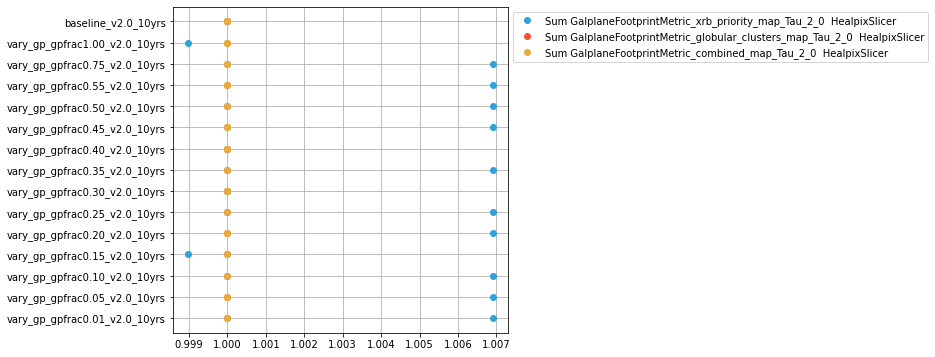

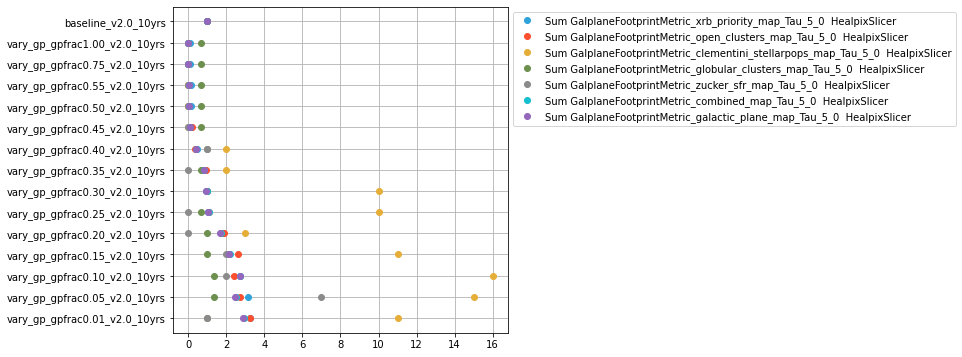

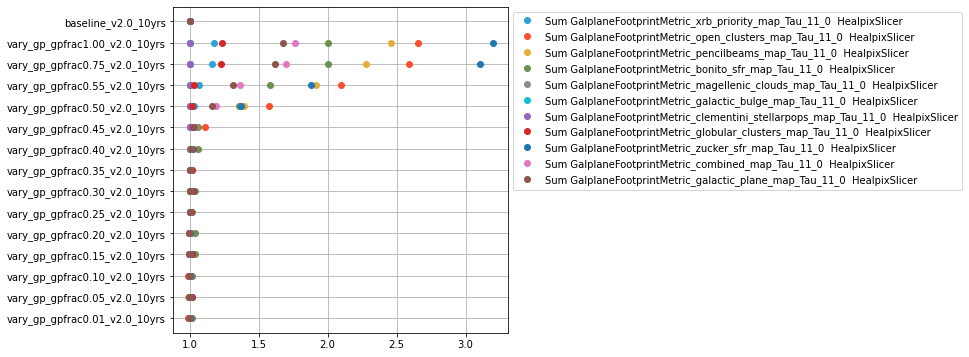

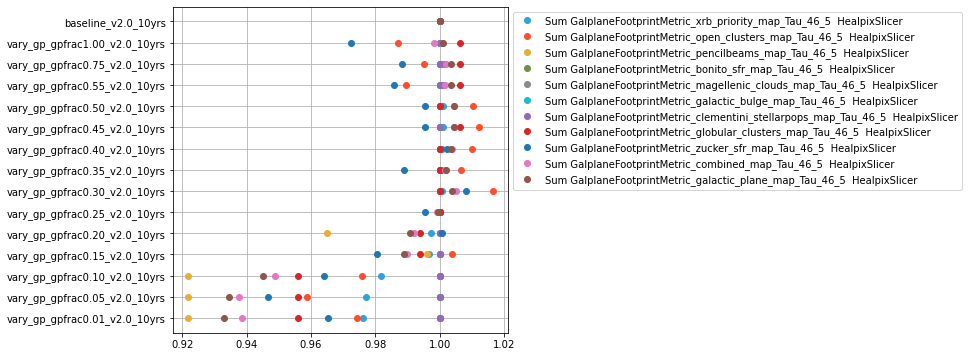

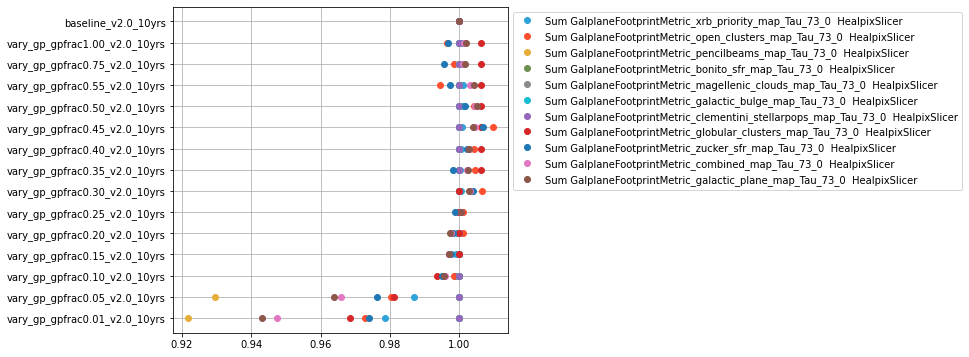

In [44]:
# Note - some of these plots show fewer than the full number of maps; this is happening because sometimes
# the *baseline* run (baseline_v2.0_10yrs) is 0 for that metric .. so the entire column become NaN
cols = [k for k in metricnames if k.startswith('footprint')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

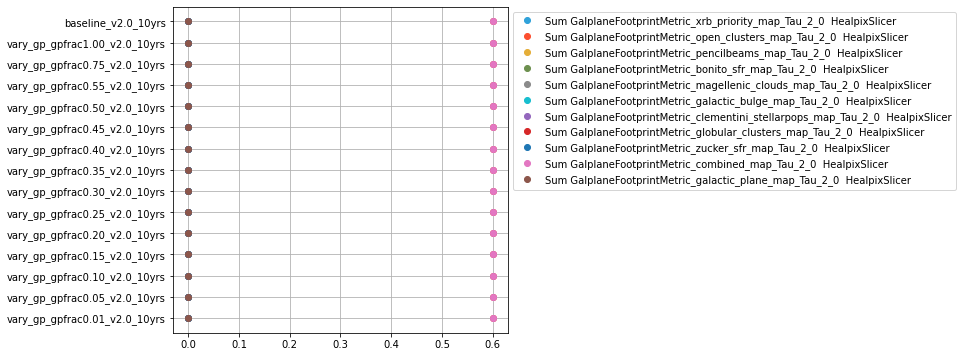

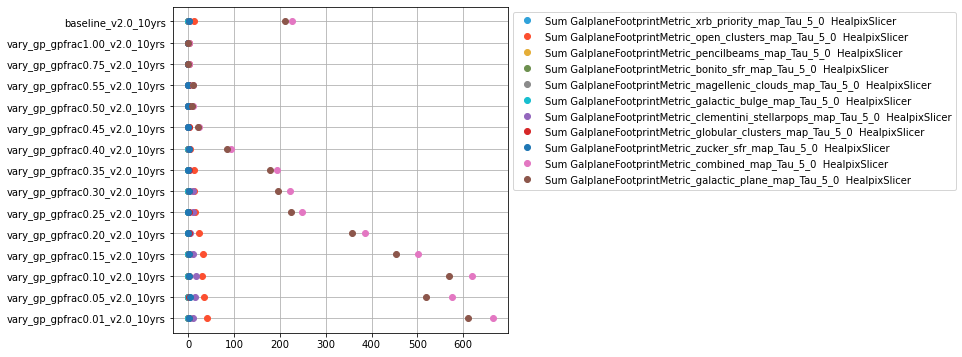

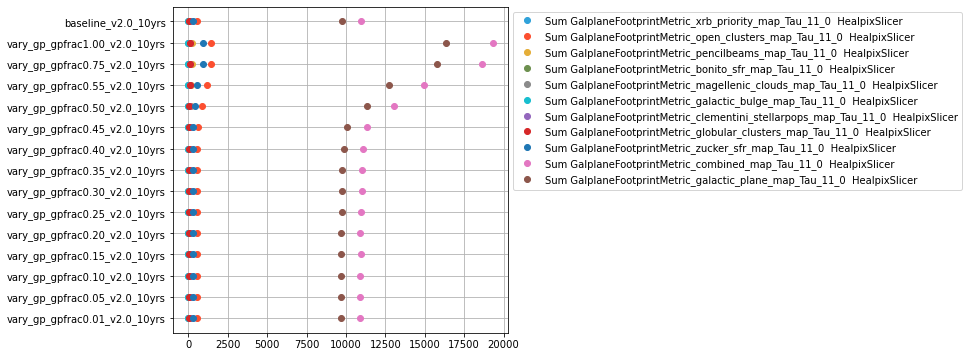

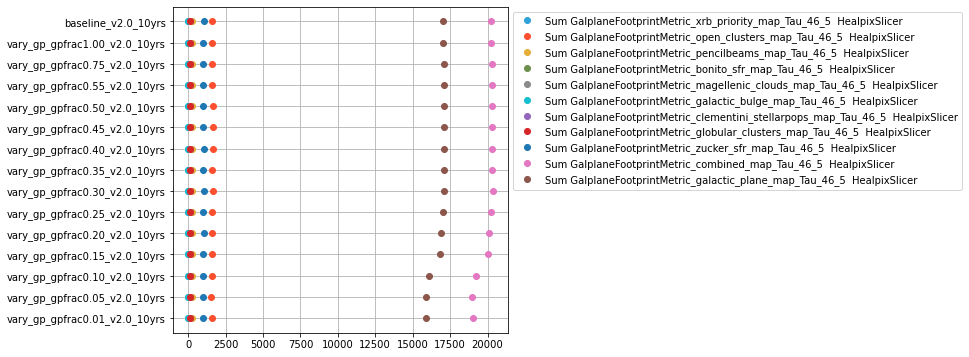

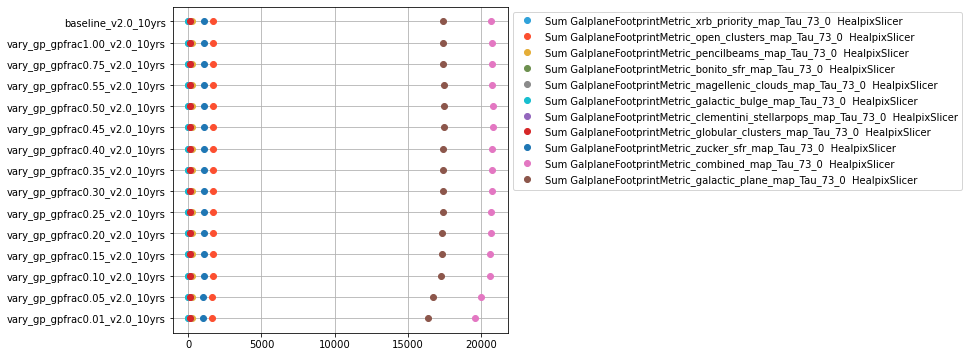

In [45]:
# Note - some of these plots show fewer than the full number of maps; this is happening because sometimes
# the *baseline* run (baseline_v2.0_10yrs) is 0 for that metric .. so the entire column become NaN
# --- see, here I plotted the non-normalized version (some maps just have much higher values)
cols = [k for k in metricnames if k.startswith('footprint')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(summaries[metricnames[k]])

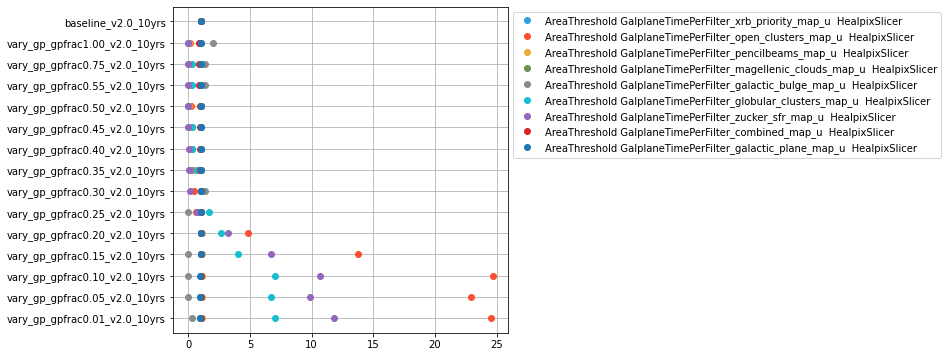

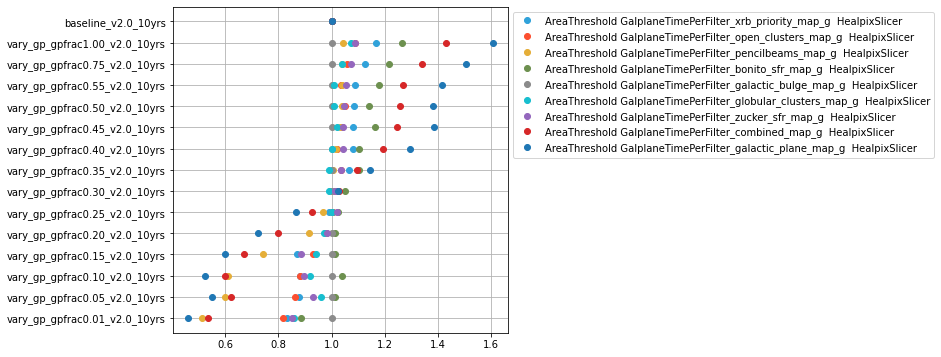

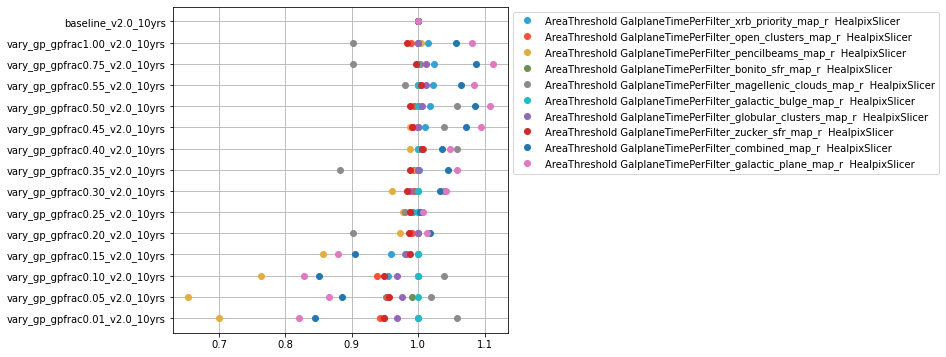

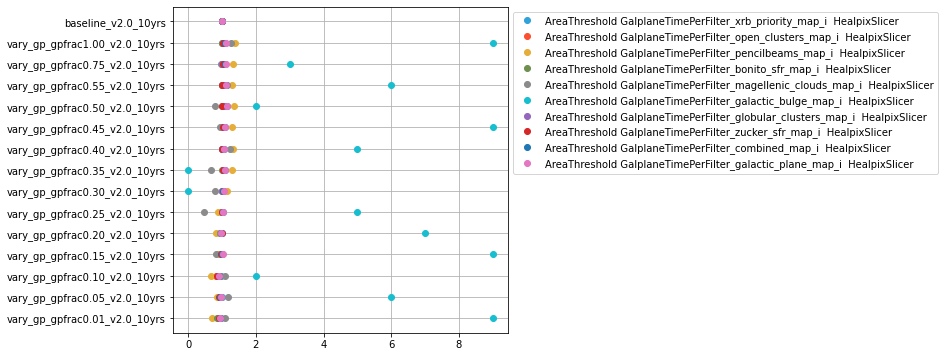

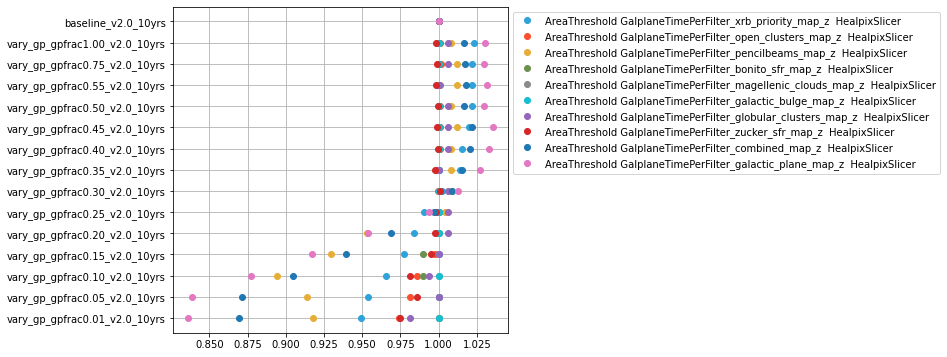

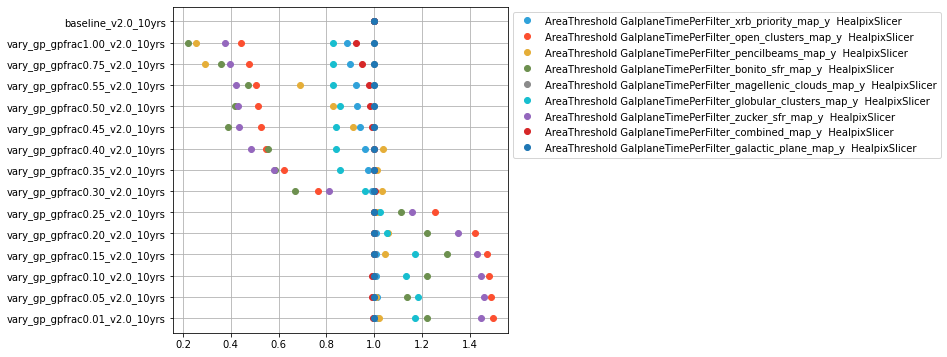

In [46]:
cols = [k for k in metricnames if k.startswith('area filter')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

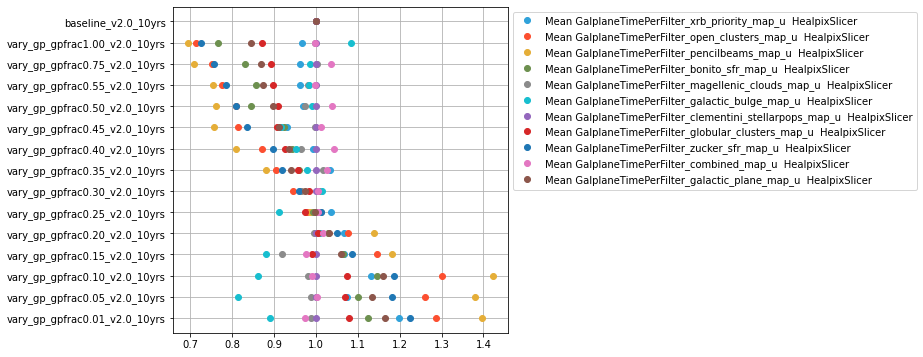

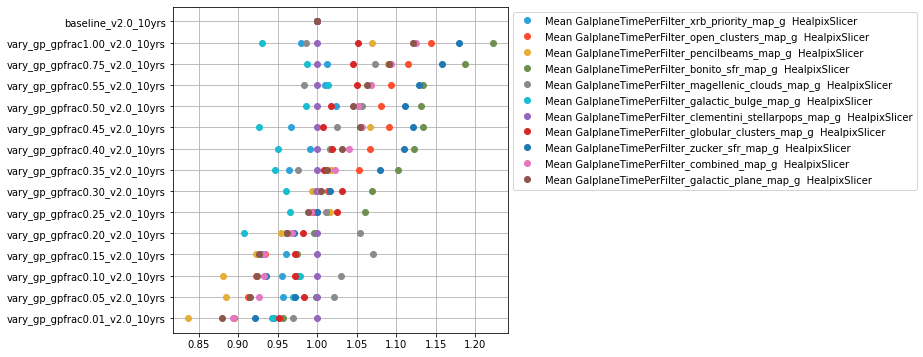

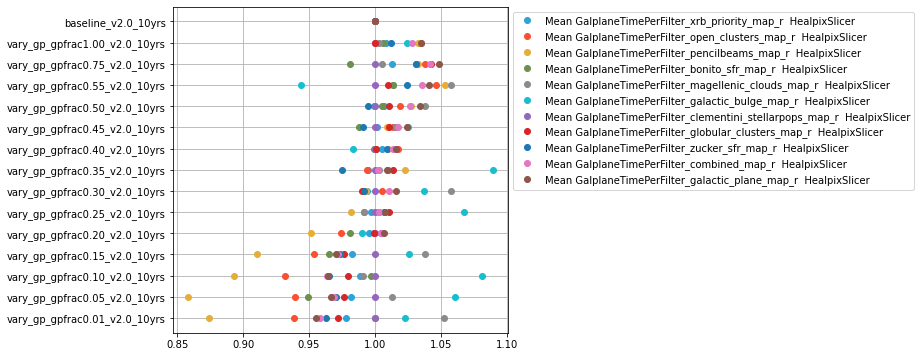

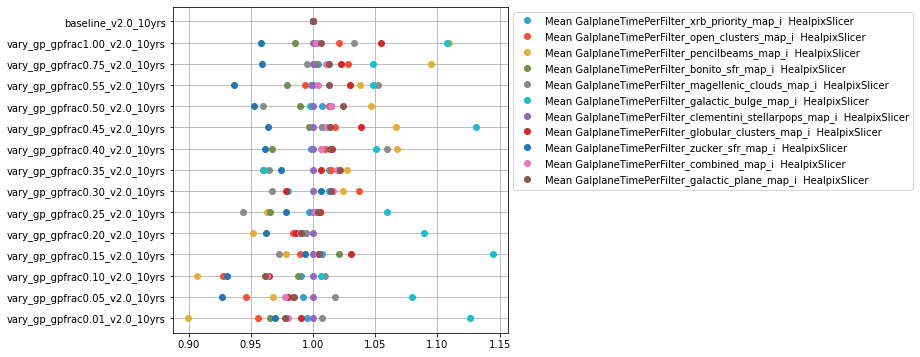

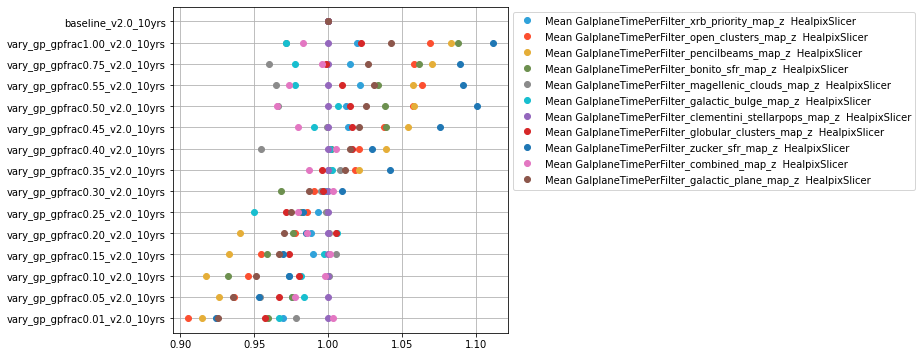

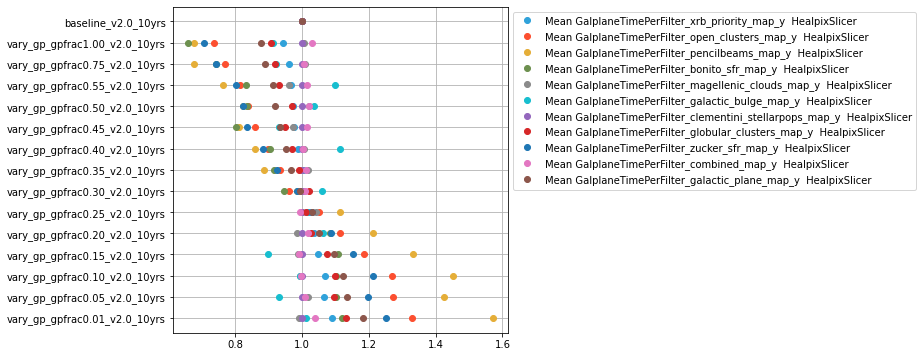

In [47]:
cols = [k for k in metricnames if k.startswith('mean filter')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

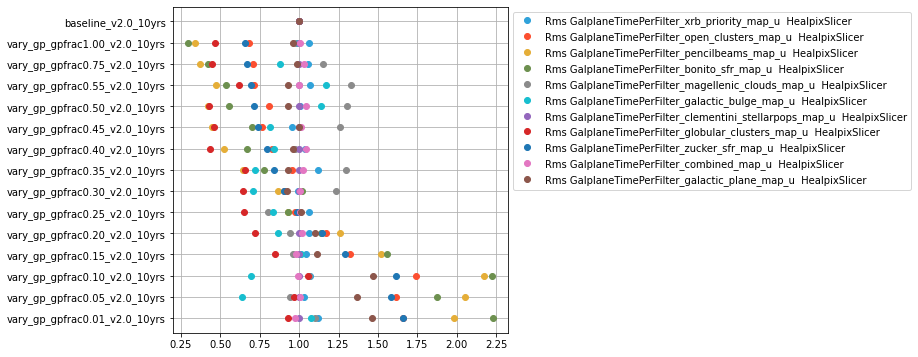

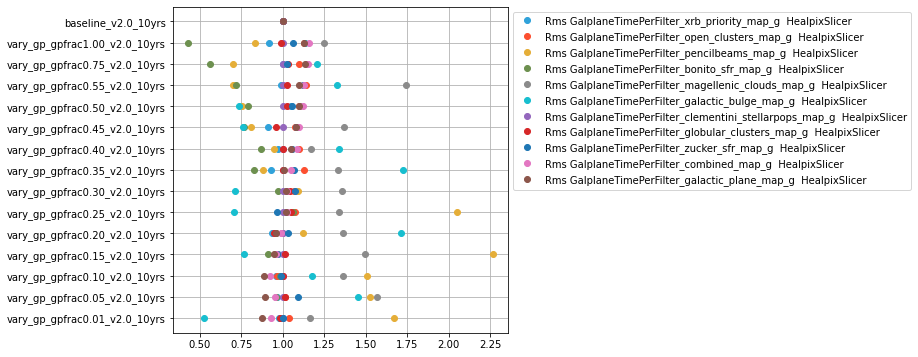

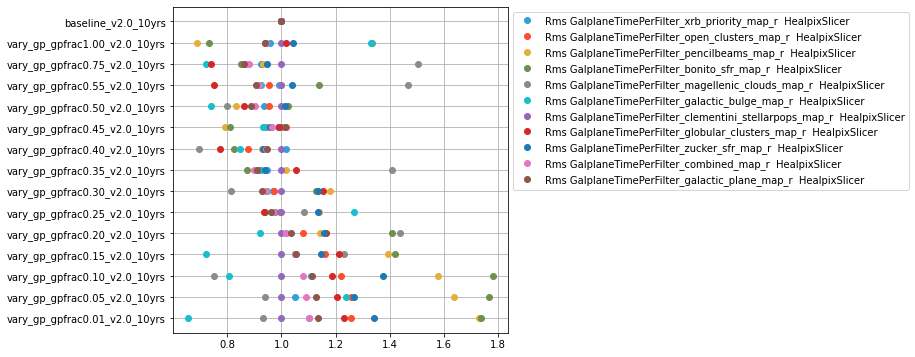

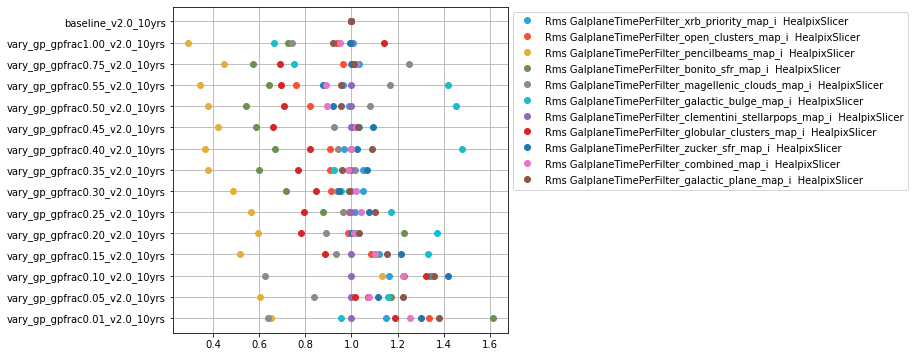

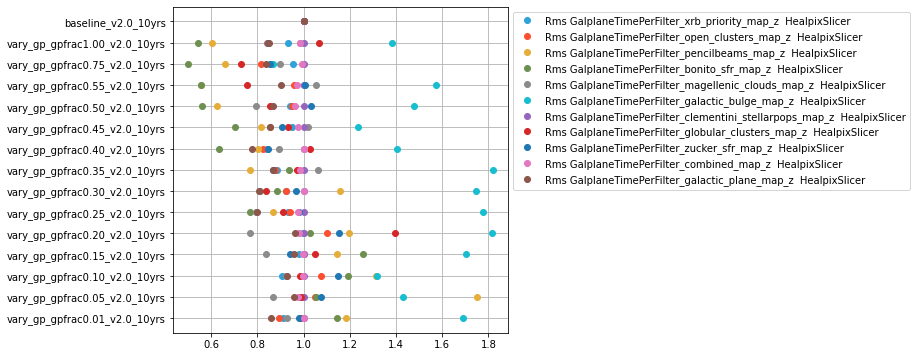

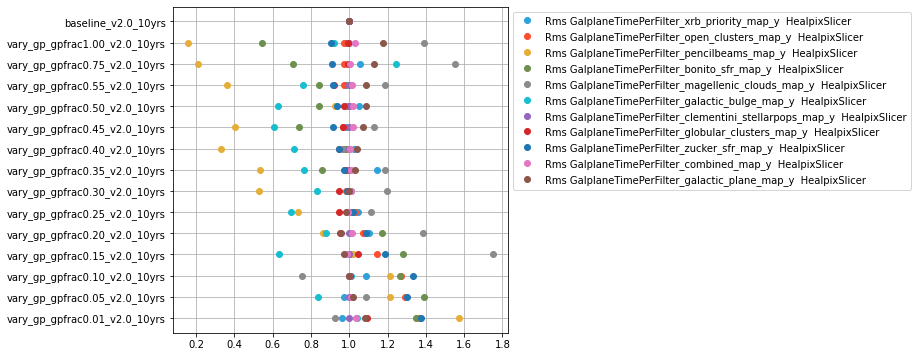

In [48]:
cols = [k for k in metricnames if k.startswith('rms filter')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

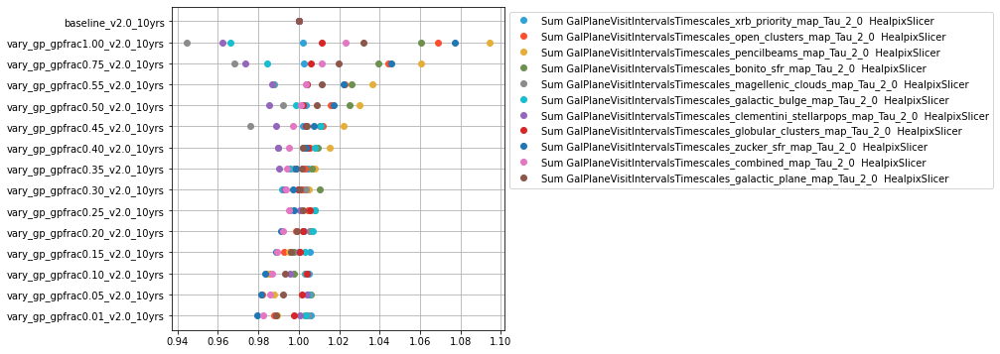

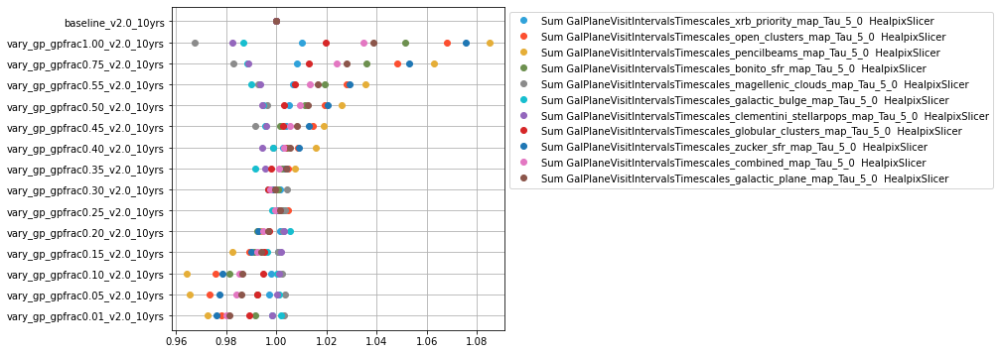

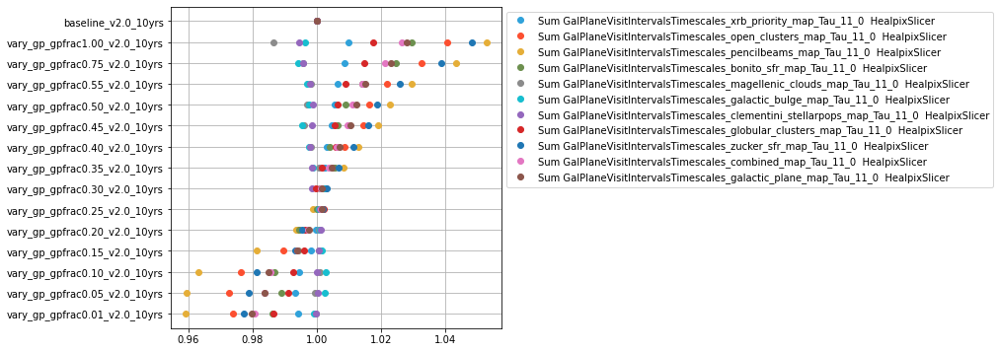

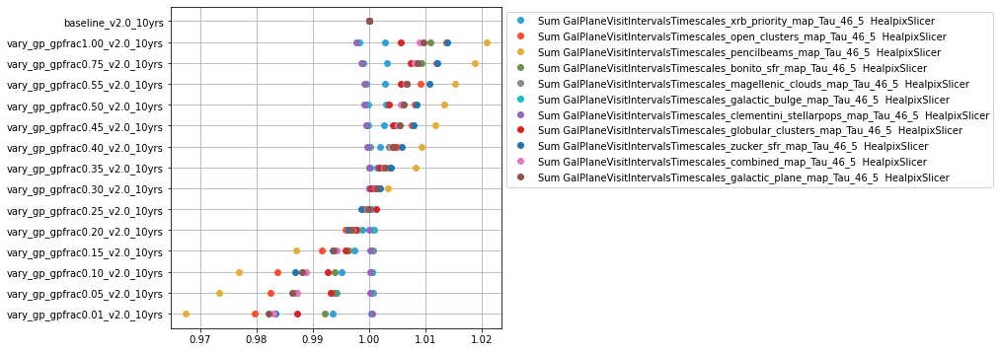

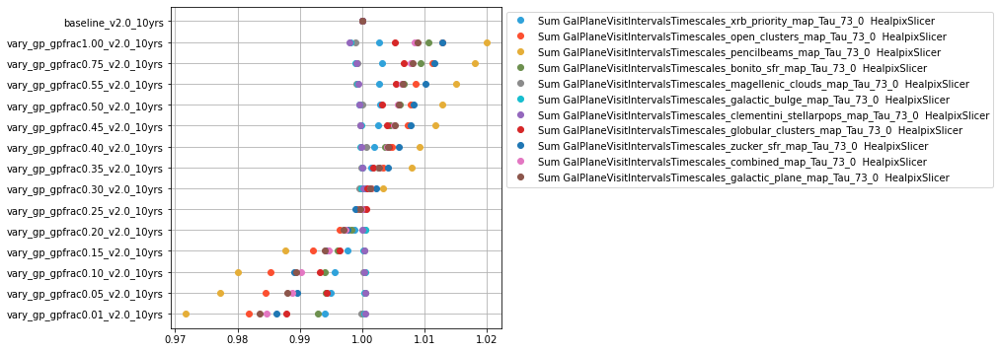

In [49]:
cols = [k for k in metricnames if k.startswith('sum visit')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

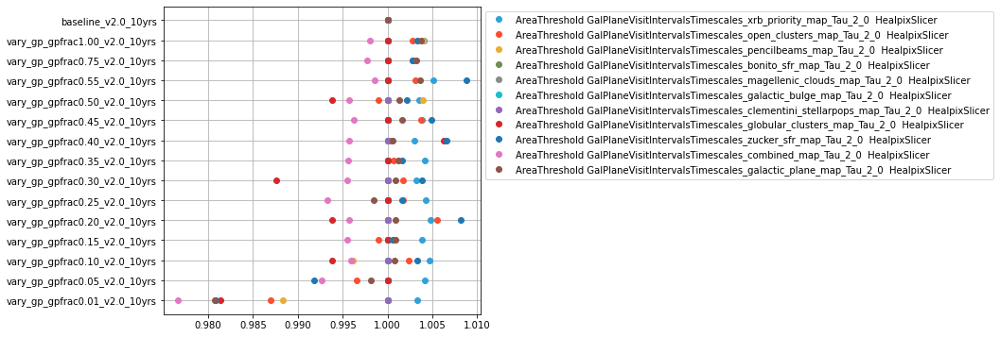

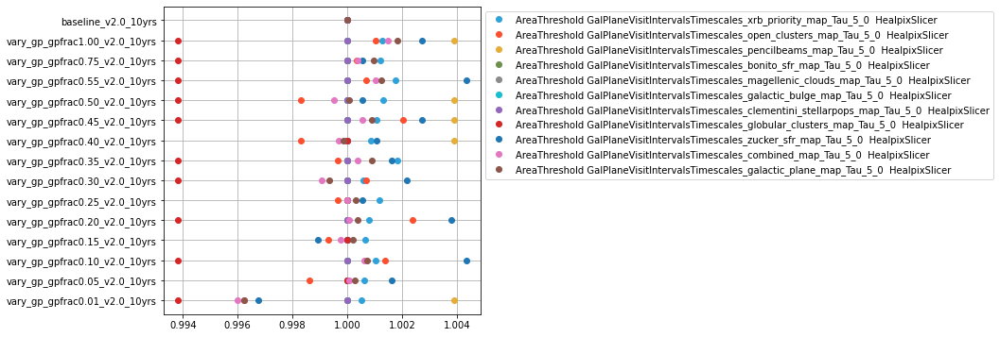

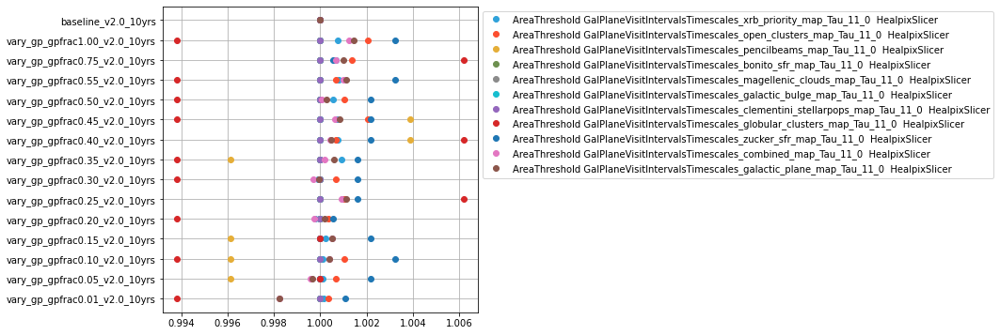

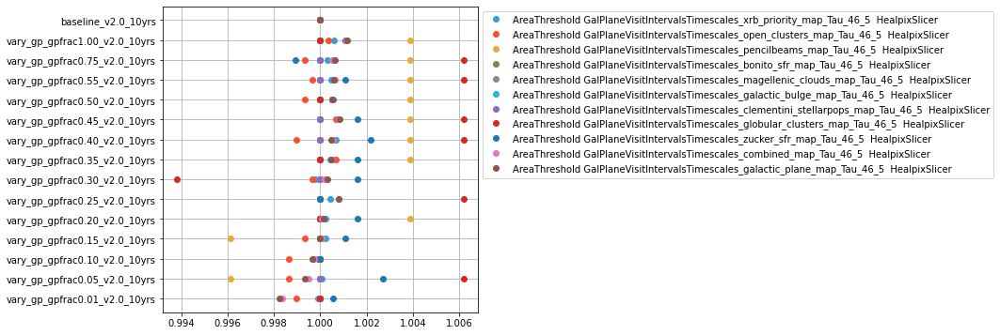

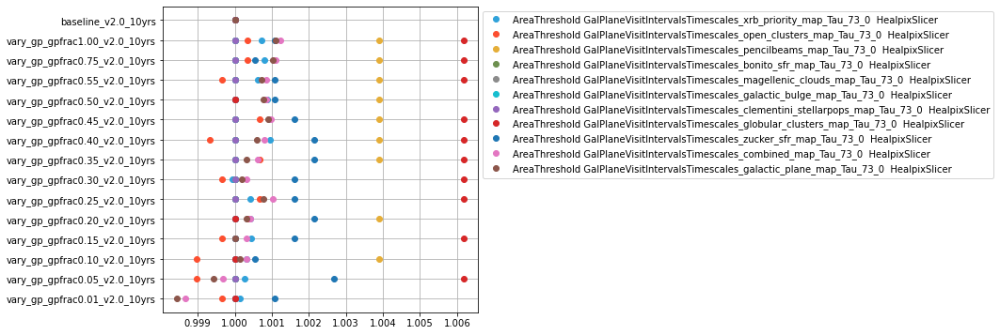

In [50]:
cols = [k for k in metricnames if k.startswith('area visit')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

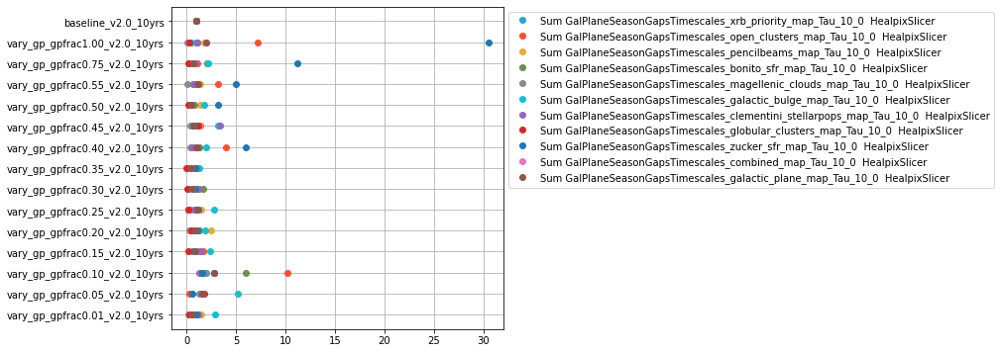

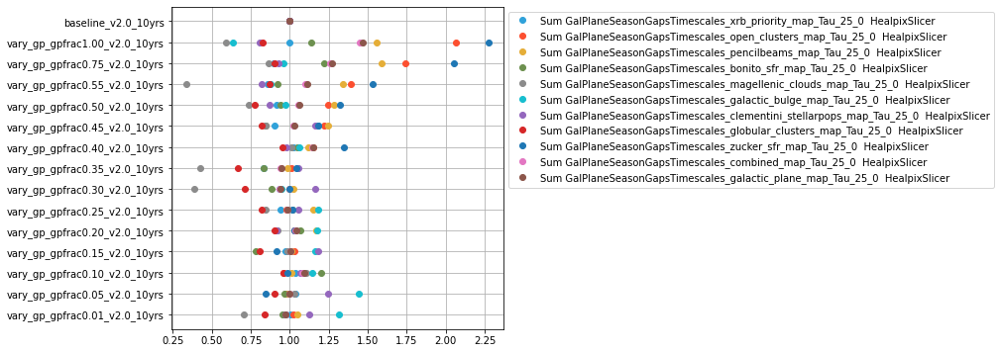

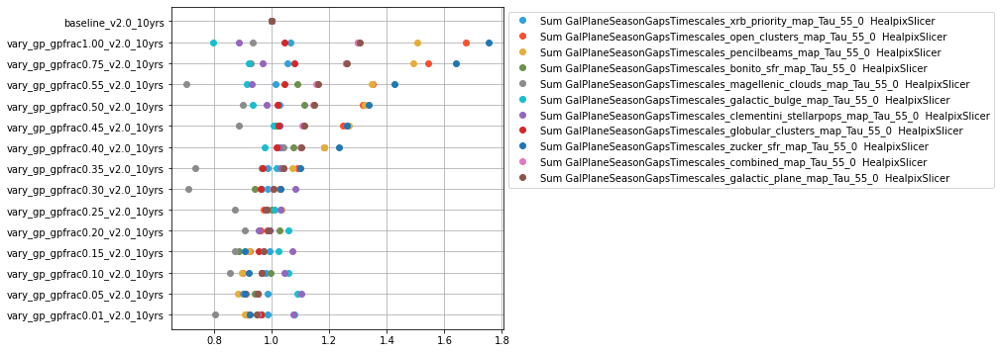

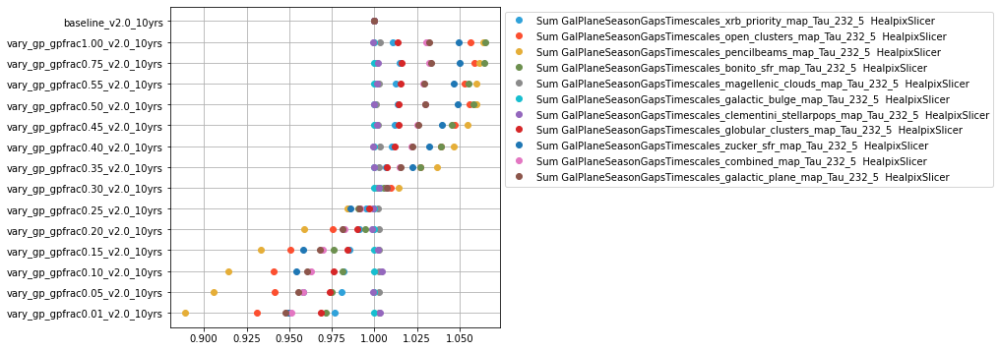

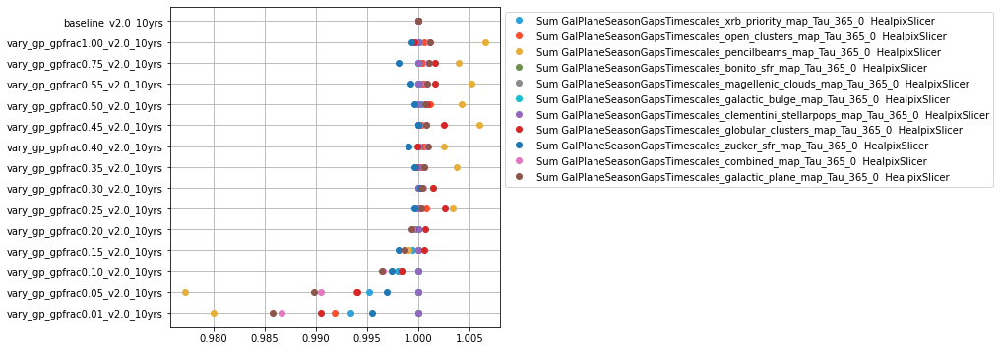

In [51]:
cols = [k for k in metricnames if k.startswith('sum season')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

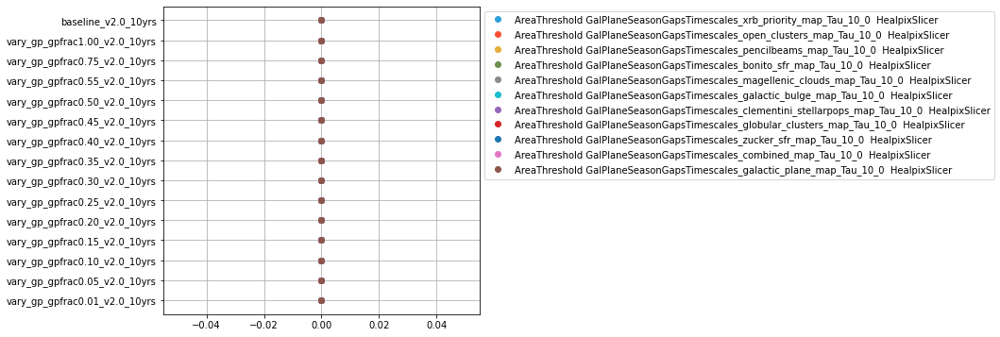

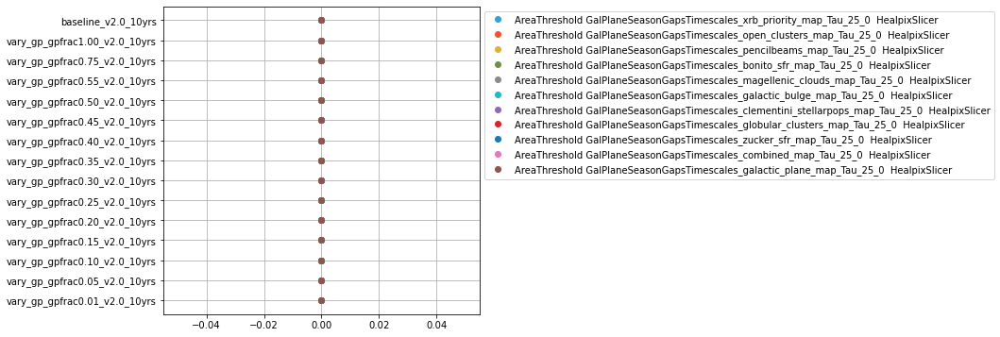

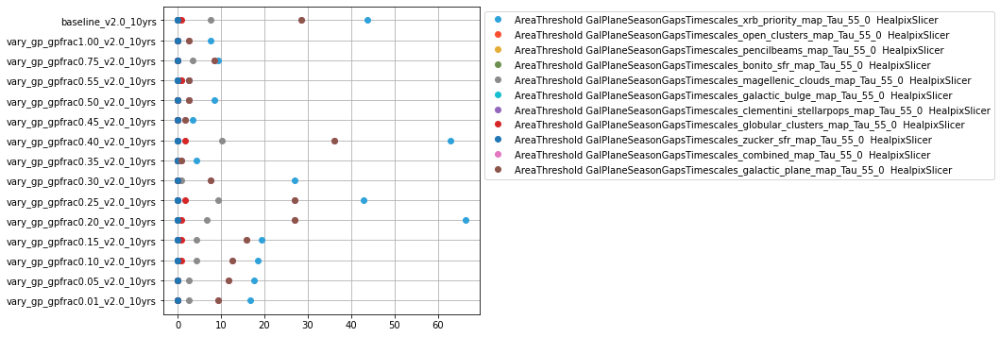

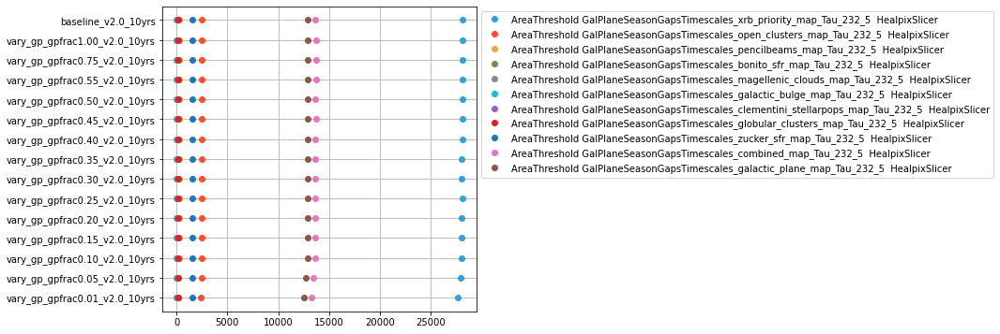

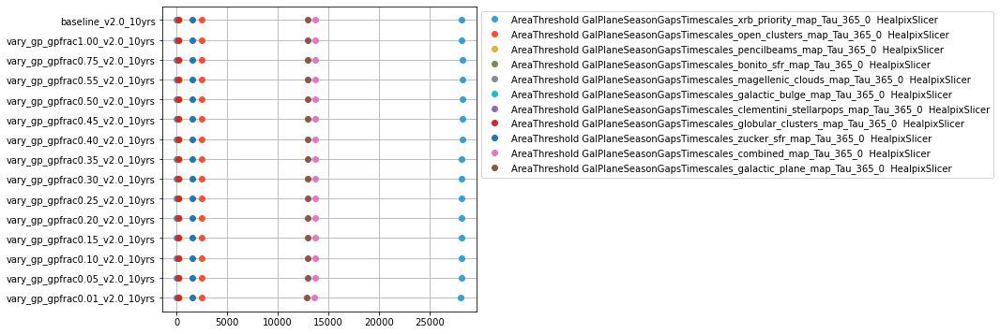

In [52]:
cols = [k for k in metricnames if k.startswith('area season')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(summaries[metricnames[k]])